# Assignment 2: Regularization and Model Evaluation

Let us kick things off with some exports and configurations.

In [190]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import itertools
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format='retina'
plt.rc('axes', axisbelow=True)

## Task 1: Linear regression with non-linear basis functions
### 1.1 Data generation

The following plot showcases our synthetic data for this first task.

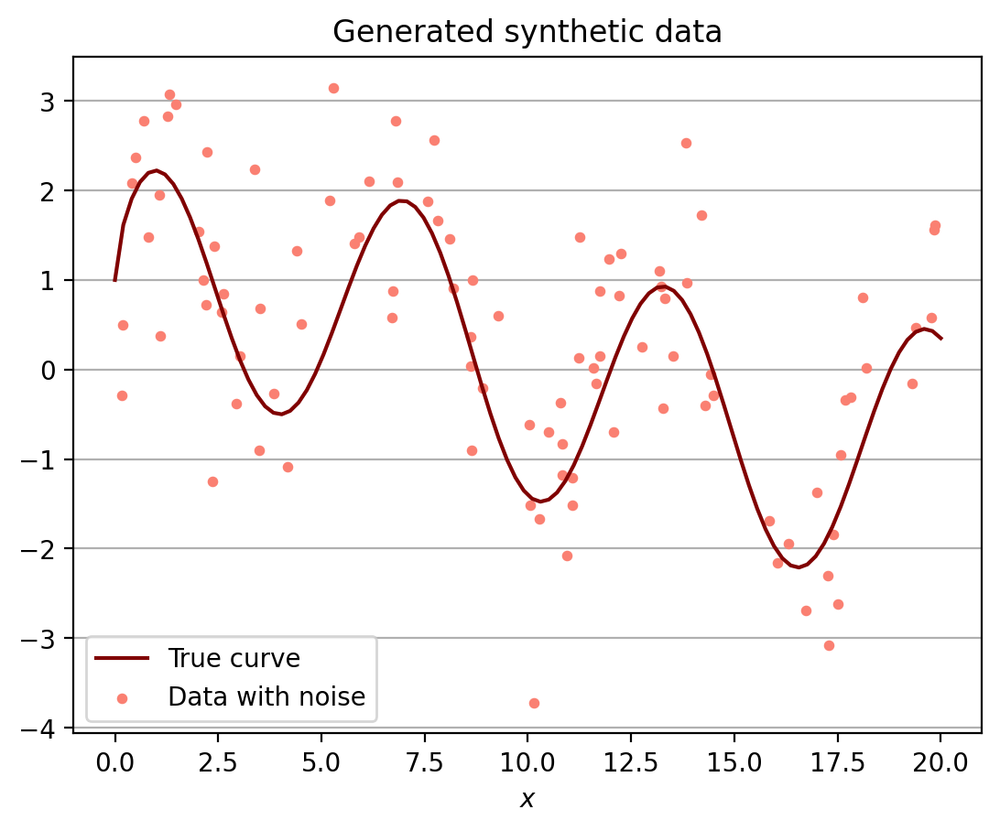

In [119]:
N = 100
rng = (0, 20)
domain = np.linspace(*rng, N)

f = lambda x: np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)

x = np.random.uniform(*rng, N)
y = f(x) + np.random.standard_normal(N)

plt.plot(domain, f(domain), label='True curve', c='maroon')
plt.scatter(x, y, label='Data with noise', c='salmon', s=10)
plt.xlabel('$x$')
plt.grid(axis='y')
plt.title("Generated synthetic data")
plt.legend()

plt.savefig("1.1.png", dpi=600, bbox_inches='tight')


### 1.2 Non-linear basis functions

Let us implement a linear regression class using non-linear bases to help simplify interactions. And some utility functions as well.

In [3]:
class LinearRegressionNLB:
  def __init__(self, bias: bool = True, bases: int = 0):
    self.bias = bias
    self.weights = None
    self.mu = None if bases == 0 else np.linspace(*rng, bases)

  def fit(self, x: np.ndarray, y: np.ndarray):
    x = self.phi(x)

    if x.ndim == 1:
      x = x[:, None]

    if self.bias:
      x = np.column_stack([x, np.ones(x.shape[0])])

    self.weights = np.linalg.pinv(x.T @ x) @ x.T @ y

  def predict(self, x: np.ndarray):
    x = self.phi(x)

    if self.bias:
      x = np.column_stack([x, np.ones(x.shape[0])])

    return x @ self.weights

  def phi(self, x: np.ndarray):
    if self.mu is not None:
      return gaussian(x[:, None], self.mu, 1)
    return x


def gaussian(x: np.ndarray, mu: np.ndarray, sigma: float):
  return np.exp(-((x - mu) / sigma) ** 2)

def sse(yh: np.ndarray, y: np.ndarray):
  return 0.5 * np.sum((y - yh) ** 2)

def mse(yh: np.ndarray, y: np.ndarray):
  return np.mean((y - yh) ** 2)

def split(x: np.ndarray, y: np.ndarray, train_ratio: float):
  N = x.shape[0]

  idxs = np.arange(N)

  split_idx = int(train_ratio * N)
  train_idxs = idxs[:split_idx]
  test_idxs = idxs[split_idx:]

  return x[train_idxs], y[train_idxs], x[test_idxs], y[test_idxs]

Now, let us plot a fit and the Gaussian bases for $D=20$.

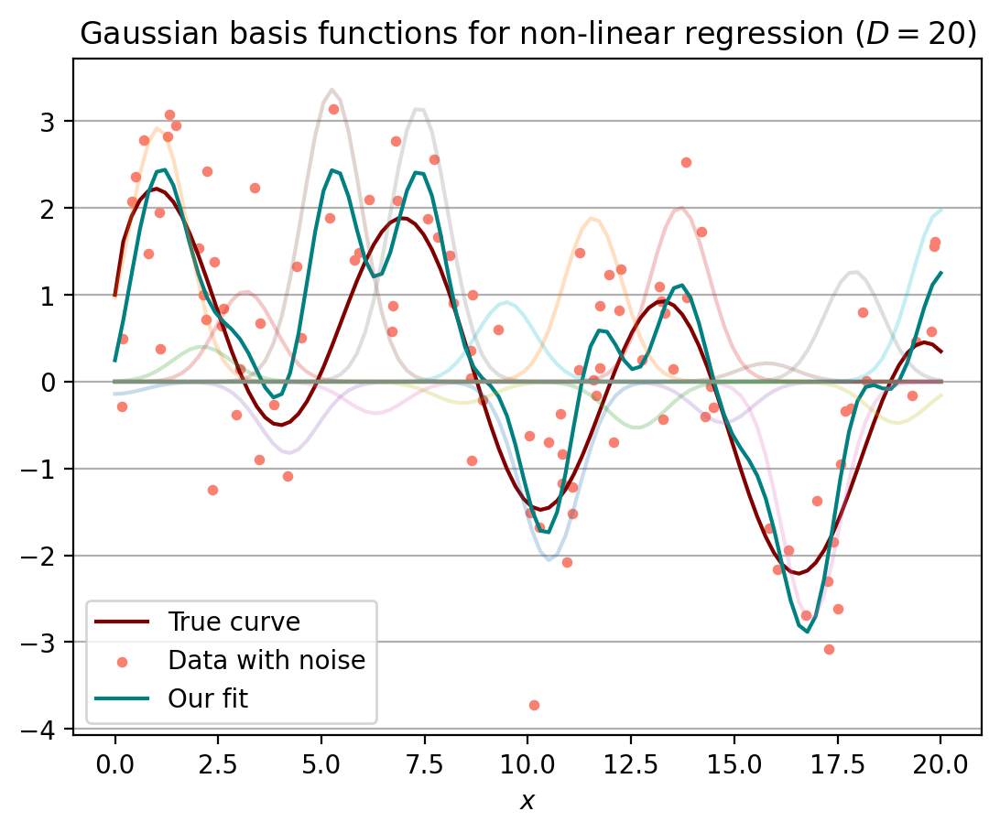

In [202]:
D = 20
model = LinearRegressionNLB(bases=D)
model.fit(x, y)

yh = model.predict(domain)

plt.plot(domain, f(domain), label='True curve', c='maroon')
plt.scatter(x, y, label='Data with noise', c='salmon', s=10)
plt.plot(domain, yh, label='Our fit', c='teal')
plt.xlabel('$x$')
plt.grid(axis='y')
plt.title(f"Gaussian basis functions for non-linear regression ($D={D}$)")
plt.legend()

for d in range(D):
  plt.plot(domain, model.weights[d] * model.phi(domain)[:, d], alpha=0.25)

plt.savefig("1.2.png", dpi=600, bbox_inches='tight')


We can see how each basis function locally resembles (somewhat) the "peaks" and "valleys" of our fit, indicating their contributions.

### 1.3-1.5 Model fitting and selection

Let us go ahead and plot the fits for the different values of $D$. We will plot them in different subplots to avoid crowding. The final plot (bottom right) shows the results of the model selection process and the most optimal model. We will utilize an 80-20 train-validation split for all fits.

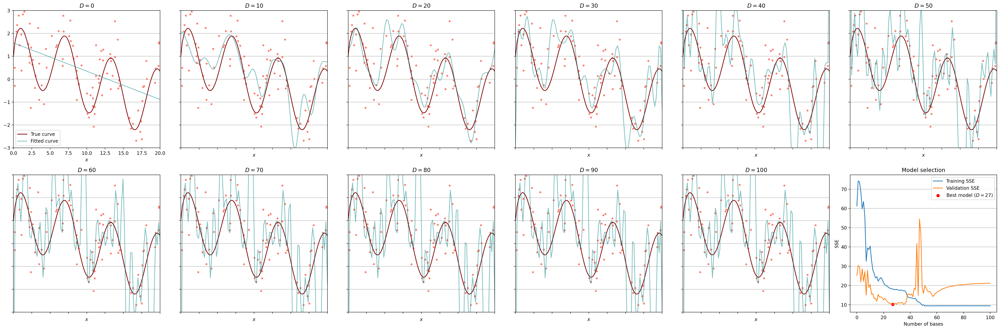

In [203]:
fig, axes = plt.subplots(2, 6, figsize=(30, 10))
bases = list(range(101))
train_sses = []
test_sses = []

x_train, y_train, x_test, y_test = split(x, y, 0.8)

for b in bases:
  model = LinearRegressionNLB(bases=b)
  model.fit(x_train, y_train)

  yh_train = model.predict(x_train)
  yh_test = model.predict(x_test)

  train_sses.append(sse(yh_train, y_train))
  test_sses.append(sse(yh_test, y_test))

  if b % 10 == 0:
    yh = model.predict(domain)

    ax = axes[(b // 10) // 6][(b // 10) % 6]
    ax.scatter(x, y, c='salmon', s=10)
    ax.plot(domain, f(domain), 'maroon', label="True curve")
    ax.plot(domain, yh, 'teal', alpha=0.5, label="Fitted curve")
    ax.set_title(f"$D={b}$")
    ax.set_xlim(*rng)
    ax.set_ylim(-3, 3)
    ax.set_xlabel("$x$")
    ax.grid(axis='y')

    if b == 0:
      ax.legend()
    else:
      ax.set_xticklabels([])
      ax.set_yticklabels([])

# Model selection plot
ax = axes.flat[-1]

best = bases[np.argmin(test_sses)]

ax.plot(bases, train_sses, label="Training SSE")
ax.plot(bases, test_sses, label="Validation SSE")
ax.scatter(best, min(test_sses), c='r', label=f"Best model ($D={best}$)")

ax.set_xlabel("Number of bases")
ax.set_ylabel("SSE")

ax.legend()
ax.grid(axis='y')
ax.set_title("Model selection")
plt.tight_layout()

plt.savefig("1.3-1.5.png", dpi=600, bbox_inches='tight')


As expected, we see that as the complexity (number of bases) of the model increases, the _training_ error decreases accordingly. At the start (when $D=0$), we see that the model is undefitting the data and both the training and test errors are relatively high. However, as we increase the model's complexity, both errors decrease, but after about $D=40$, we see the validation skyrocket, indicating overfitting to the training set. We see the optimal complexity is $D=27$. Note that the validation error is initially lower than the training error due to the fact we are using sum of squared errors, which is proportional to the size of the set (validation set is much smaller).

## Task 2: Bias-variace tradeoff with multiple fits

As before, we will repeat the procedure ten times, but sampling new values for `y` each time (we will retain `x` to allow proper averaging). We will use the same 80-20 train-validation split. As suggested, we will now use mean squared errors rather than the sum of squared errors, to better compare our results.

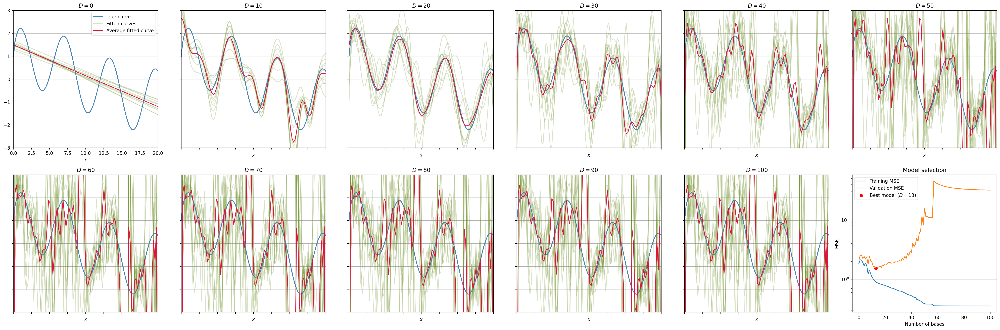

In [208]:
fig, axes = plt.subplots(2, 6, figsize=(30, 10))
bases = list(range(101))

train_mses = []
test_mses = []
models = [[] for _ in range(0, 101, 10)]

for i in range(10):
  y_i = f(x) + np.random.standard_normal(N)

  x_train, y_train, x_test, y_test = split(x, y_i, 0.8)
  train_i_mses = []
  test_i_mses = []

  for b in bases:
    model = LinearRegressionNLB(bases=b)
    model.fit(x_train, y_train)

    yh_train = model.predict(x_train)
    yh_test = model.predict(x_test)

    train_i_mses.append(mse(yh_train, y_train))
    test_i_mses.append(mse(yh_test, y_test))

    if b % 10 == 0:
      yh = model.predict(domain)
      models[b // 10].append(yh)

      ax = axes[(b // 10) // 6][(b // 10) % 6]
      ax.plot(domain, f(domain), 'steelblue', label="True curve" if i == 0 else None)
      ax.plot(domain, yh, 'olivedrab', alpha=0.25, label="Fitted curves" if i == 0 else None)

      if i == 0:
        ax.set_title(f"$D={b}$")
        ax.set_xlim(*rng)
        ax.set_ylim(-3, 3)
        ax.set_xlabel("$x$")
        ax.grid(axis='y')

        if b != 0:
          ax.set_xticklabels([])
          ax.set_yticklabels([])

  train_mses.append(train_i_mses)
  test_mses.append(test_i_mses)


train_mses = np.mean(train_mses, axis=0)
test_mses = np.mean(test_mses, axis=0)
models = np.mean(models, axis=1)

for i, model in enumerate(models):
  ax = axes[i // 6][i % 6]
  ax.plot(domain, model, 'crimson', label="Average fitted curve")

  if i == 0:
    ax.legend()

# Model selection plot
ax = axes.flat[-1]

best = bases[np.argmin(test_mses)]

ax.plot(bases, train_mses, label="Training MSE")
ax.plot(bases, test_mses, label="Validation MSE")
ax.scatter(best, min(test_mses), c='r', label=f"Best model ($D={best}$)")

ax.set_xlabel("Number of bases")
ax.set_ylabel("MSE")

ax.legend()
ax.grid(axis='y')
ax.set_yscale('log')
ax.set_title("Model selection")
plt.tight_layout()

plt.savefig("2.png", dpi=600, bbox_inches='tight')


Since our plotted bases are skewed towards those with high variance, the presence of bias seems minimals apart from the initial $D=0$ fit. However, as we see from the MSE curves, there are initially high training and validation errors, indicative of high bias. Up to the $D=20$ curve, we also see there is little variation in the ten fitted models (in green). However, as we proceed with more bases, we see that the model tends to overfit to the training data, indicated by the high variance and the Gaussian noise in the average fitted curves. This is also validated by the MSE curves, which show minimal training errors, but large validation errors.

## Task 3: Regularization with cross-validation
### 3.1-3.2 Adding regularization

Let us implement a class that allows us to add L1 and L2 regularization. This class will implement the regression via gradient descent. We will also define a utility function to allow us to run cross validation and obtain all the information we need

In [4]:
class LinearRegressionGDNLBReg:
  def __init__(
      self, bias: bool = True, bases: int = 0, l1: float = 0.0, l2: float = 0.0,
      alpha: float = 0.005, eps: float = 1e-6, itercap: int = 1e5, hist = False
    ):
    self.bias = bias
    self.weights = None
    self.mu = None if bases == 0 else np.linspace(*rng, bases)
    self.l1 = l1
    self.l2 = l2
    self.alpha = alpha
    self.eps = eps
    self.itercap = itercap
    self.hist = hist
    self.ws = []

  def gradient(self, x: np.ndarray, y: np.ndarray):
    grad = np.dot(x.T, x @ self.weights - y) / x.shape[0]
    grad[1:] += self.l2 * self.weights[1:] + self.l1 * np.sign(self.weights[1:])
    return grad

  def fit(self, x: np.ndarray, y: np.ndarray):
    x_orig = x
    x = self.phi(x)

    if x.ndim == 1:
      x = x[:, None]
      x_orig = x

    N, D = x.shape

    if self.bias:
      x = np.column_stack([x, np.ones(N)])
      D += 1

    self.weights = np.zeros(D)
    gradient = np.inf
    prev = np.inf
    curr = 0.5 * mse(self.predict(x_orig), y)
    t = 0

    while abs(prev - curr) > self.eps and t < self.itercap:
      if self.hist:
        self.ws.append(self.weights.copy())
      t += 1
      prev = curr

      gradient = self.gradient(x, y)
      self.weights -= self.alpha * gradient
      curr = 0.5 * mse(self.predict(x_orig), y)

    if self.hist:
      self.ws.append(self.weights.copy())

    return (t, gradient)


  def predict(self, x: np.ndarray):
    x = self.phi(x)

    if self.bias:
      x = np.column_stack([x, np.ones(x.shape[0])])

    return x @ self.weights

  def phi(self, x: np.ndarray):
    if self.mu is not None:
      return gaussian(x[:, None], self.mu, 1)
    return x

def cross_validation(x: np.ndarray,  y: np.ndarray, x_test: np.ndarray, y_test: np.ndarray, folds: int, **kwargs):
  idxs = np.arange(x.shape[0])
  splits = np.array_split(idxs, folds)

  train_mses = []
  validation_mses = []
  test_mses = []
  predictions = []

  for i in range(folds):
    validation_idxs = splits[i]
    train_idxs = np.concatenate([splits[j] for j in range(folds) if j != i])

    x_train, y_train = x[train_idxs], y[train_idxs]
    x_validation, y_validation = x[validation_idxs], y[validation_idxs]

    model = LinearRegressionGDNLBReg(**kwargs)
    model.fit(x_train, y_train)

    yh_train = model.predict(x_train)
    yh_validation = model.predict(x_validation)
    yh_test = model.predict(x_test)

    train_mses.append(mse(yh_train, y_train))
    validation_mses.append(mse(yh_validation, y_validation))
    test_mses.append(mse(yh_test, y_test))
    predictions.append(yh_test)

  return train_mses, validation_mses, test_mses, predictions

### 3.3-3.5 Train and validation errors with bias-variance decomposition

Now, using 10-fold cross validation, let us examine how the model behaves with respect to the different regularization strengths.

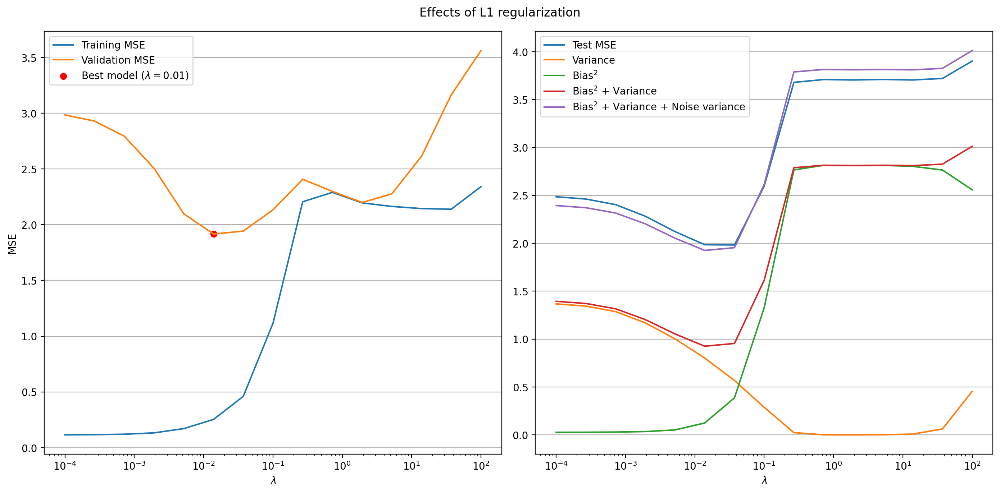

In [23]:
M = 50
N = 20
k = 10
D = 70
lambdas = np.logspace(-4, 2, 15)
x = np.random.uniform(*rng, N)

x_train, x_test = x[:int(0.8 * N)], x[int(0.8 * N):]

train_mses = [[] for _ in lambdas]
validation_mses = [[] for _ in lambdas]
test_mses = [[] for _ in lambdas]
predictions = [[] for _ in lambdas]
true_vals = f(x_test)

for _ in range(M):
  print(f"Running iteration {_ + 1} of {M}", end='\r')
  y = f(x) + np.random.standard_normal(N)

  y_train, y_test = y[:int(0.8 * N)], y[int(0.8 * N):]

  for i, l in enumerate(lambdas):
    tr, v, te, p = cross_validation(x_train, y_train, x_test, y_test, k, l1=l, bases=D)

    train_mses[i].extend(tr)
    validation_mses[i].extend(v)
    test_mses[i].extend(te)
    predictions[i].extend(p)

variances = np.mean(np.var(predictions, axis=1), axis=1)
bsq = np.mean((np.mean(predictions, axis=1) - true_vals) ** 2, axis=1)
noise_variance = 1
best = np.argmin(np.mean(validation_mses, axis=1))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

ax1.plot(lambdas, np.mean(train_mses, axis=1), label="Training MSE")
ax1.plot(lambdas, np.mean(validation_mses, axis=1), label="Validation MSE")
ax1.scatter(lambdas[best], np.mean(validation_mses, axis=1)[best], c='r', label=f"Best model ($\\lambda={lambdas[best]:.2f}$)")

ax2.plot(lambdas, np.mean(test_mses, axis=1), label="Test MSE")
ax2.plot(lambdas, variances, label="Variance")
ax2.plot(lambdas, bsq, label="Bias$^2$")
ax2.plot(lambdas, bsq + variances, label="Bias$^2$ + Variance")
ax2.plot(lambdas, bsq + variances + noise_variance, label="Bias$^2$ + Variance + Noise variance")

ax1.grid(axis='y')
ax2.grid(axis='y')
ax1.legend()
ax2.legend()
ax1.set_xscale('log')
ax2.set_xscale('log')

ax1.set_xlabel("$\\lambda$")
ax1.set_ylabel("MSE")
ax2.set_xlabel("$\\lambda$")

plt.suptitle("Effects of L1 regularization")
plt.tight_layout()
plt.savefig("3a.png", dpi=600, bbox_inches='tight')

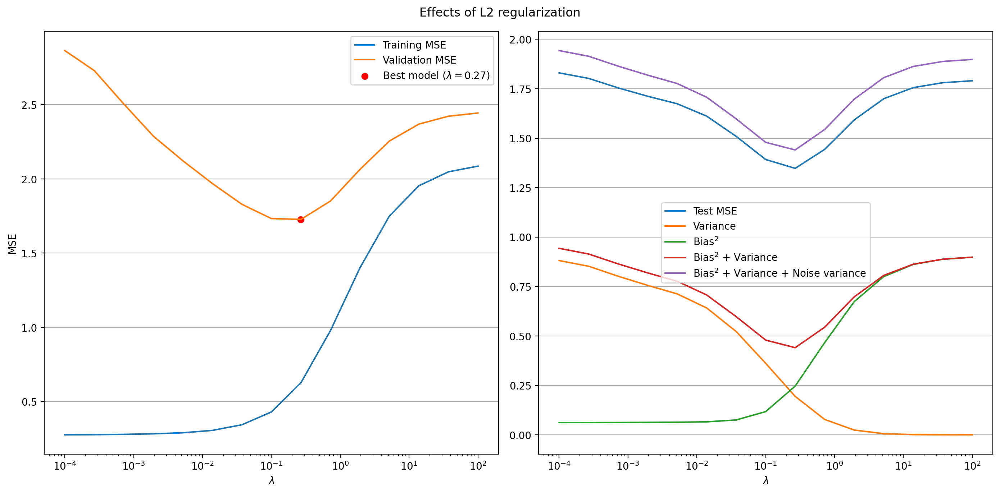

In [17]:
M = 50
N = 20
k = 10
D = 70
lambdas = np.logspace(-4, 2, 15)
x = np.random.uniform(*rng, N)

x_train, x_test = x[:int(0.8 * N)], x[int(0.8 * N):]

train_mses = [[] for _ in lambdas]
validation_mses = [[] for _ in lambdas]
test_mses = [[] for _ in lambdas]
predictions = [[] for _ in lambdas]
true_vals = f(x_test)

for _ in range(M):
  print(f"Running iteration {_ + 1} of {M}", end='\r')
  y = f(x) + np.random.standard_normal(N)

  y_train, y_test = y[:int(0.8 * N)], y[int(0.8 * N):]

  for i, l in enumerate(lambdas):
    tr, v, te, p = cross_validation(x_train, y_train, x_test, y_test, k, l2=l, bases=D)

    train_mses[i].extend(tr)
    validation_mses[i].extend(v)
    test_mses[i].extend(te)
    predictions[i].extend(p)

variances = np.mean(np.var(predictions, axis=1), axis=1)
bsq = np.mean((np.mean(predictions, axis=1) - true_vals) ** 2, axis=1)
noise_variance = 1
best = np.argmin(np.mean(validation_mses, axis=1))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

ax1.plot(lambdas, np.mean(train_mses, axis=1), label="Training MSE")
ax1.plot(lambdas, np.mean(validation_mses, axis=1), label="Validation MSE")
ax1.scatter(lambdas[best], np.mean(validation_mses, axis=1)[best], c='r', label=f"Best model ($\\lambda={lambdas[best]:.2f}$)")

ax2.plot(lambdas, np.mean(test_mses, axis=1), label="Test MSE")
ax2.plot(lambdas, variances, label="Variance")
ax2.plot(lambdas, bsq, label="Bias$^2$")
ax2.plot(lambdas, bsq + variances, label="Bias$^2$ + Variance")
ax2.plot(lambdas, bsq + variances + noise_variance, label="Bias$^2$ + Variance + Noise variance")

ax1.grid(axis='y')
ax2.grid(axis='y')
ax1.legend()
ax2.legend()
ax1.set_xscale('log')
ax2.set_xscale('log')

ax1.set_xlabel("$\\lambda$")
ax1.set_ylabel("MSE")
ax2.set_xlabel("$\\lambda$")

plt.suptitle("Effects of L2 regularization")
plt.tight_layout()
plt.savefig("3b.png", dpi=600, bbox_inches='tight')

We see that the optimal regularization strenghts are 0.01 and 0.27 for L1 and L2 regularization, respectively. When we look at the bias-variance decompositions, we see that as the regularization strength increases, the variance of the model decreases, which is as expected. Similarly, we see that the bias of the model increases, i.e., the higher regularization leads to a more constrained (less expressive) model. In between the transition of the two quantities is where we see the optima. Moreover, as expected, the sum of the squared bias, variance, and variance of the noise is approximately equal to the mean squared error of the test results, with the variations likely due to randomness. And finally, another interesting thing to note is the abrupt changes in the bias-variance decomposition of the L1 regularization, likely due to the fact that it encourages sparesness.

## Task 4: Effect of L1 and L2 regularization on loss
### 4.1 Generating synthetic data

Let us quickly generate our synthetic data according to the function and distribution given.

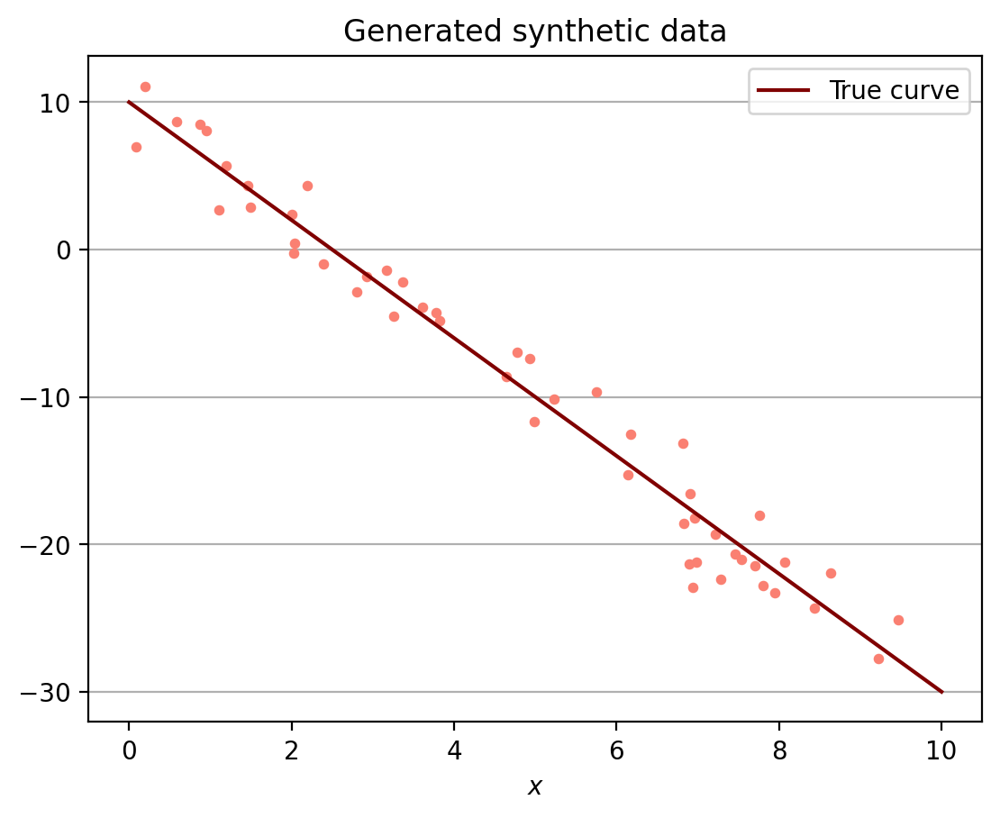

In [213]:
rng = (0, 10)
N = 50
f = lambda x: -4 * x + 10


x = np.random.uniform(*rng, N)
y = f(x) + 2 * np.random.standard_normal(N)

plt.scatter(x, y, c='salmon', s=10)
plt.plot(np.linspace(*rng, N), f(np.linspace(*rng, N)), c='maroon', label="True curve")
plt.xlabel("$x$")
plt.grid(axis='y')
plt.title("Generated synthetic data")
_ = plt.legend()


### 4.2-4.5 Analysing effects of regularization on gradient descent

Let us first define the utility function needed for this task (to plot contours).

In [214]:
def plot_contour(f, w0bound, w1bound, resolution, ax):
    w0range = np.linspace(w0bound[0], w0bound[1], resolution)
    w1range = np.linspace(w1bound[0], w1bound[1], resolution)
    xg, yg = np.meshgrid(w0range, w1range)
    zg = np.zeros_like(xg)
    for i,j in itertools.product(range(resolution), range(resolution)):
        zg[i,j] = f([xg[i,j], yg[i,j]])
    ax.contour(xg, yg, zg, 100)
    return ax

Now, let us examine the gradient descent path for both kinds of regularization for $\lambda = 0.01, 1, 100$.

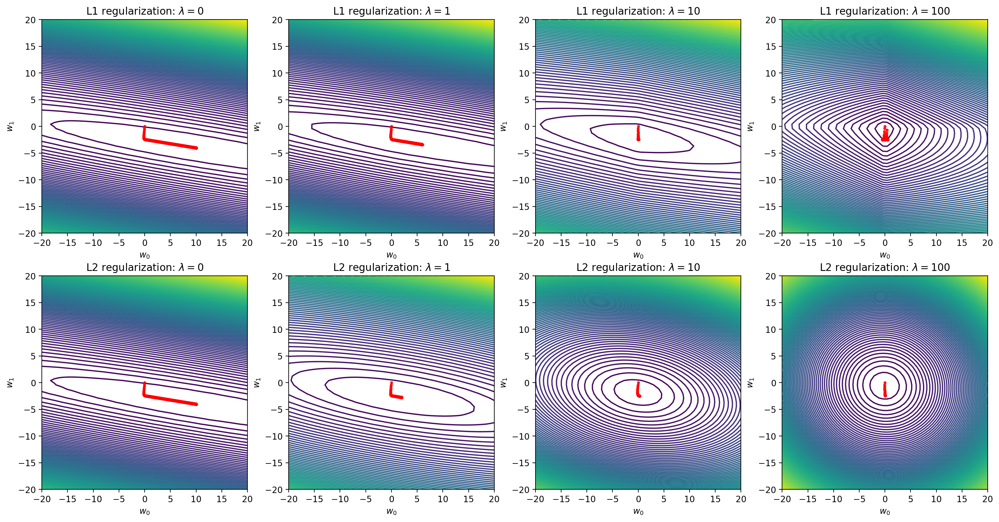

In [224]:
lambdas = [0, 1, 10, 100]
cost = lambda w: 0.5 * np.mean((w[0] + w[1] * x - y) ** 2)
l1_penalty = lambda w: np.sum(np.abs(w))
l2_penalty = lambda w: np.dot(w, w) / 2

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for i in range(2):
  penalty = l1_penalty if i == 0 else l2_penalty
  for j in range(len(lambdas)):
    ax = axes[i][j]
    l = lambdas[j]
    model = LinearRegressionGDNLBReg(l1=l if i == 0 else 0, l2=l if i == 1 else 0, hist=True)
    t, _ = model.fit(x, y)
    plot_contour(lambda w: cost(w) + l * penalty(w), [-20, 20], [-20, 20], 50, ax)

    weights = np.array(model.ws)

    ax.plot(weights[:, 1], weights[:, 0], '.r', alpha=0.8, markersize=5)
    ax.plot(weights[:, 1], weights[:, 0], '-r', alpha=0.3)

    ax.set_xlabel("$w_0$")
    ax.set_ylabel("$w_1$")
    ax.set_title(f"L{i + 1} regularization: $\\lambda={l}$")

plt.savefig("4.png", dpi=600, bbox_inches='tight')

## Originality/Creativity: Grid search over L1 and L2 regularization strengths

Here, let us utilize our cross-validation infrastructure to evaluate how using combinations of L1 and L2 regularization together influence the validation errors. We will retain the parameters exactly from Task 3, but use 10 datasets for our grid search.

Best model MSE: 1.733612992055902th (λ1=15, λ2=15)


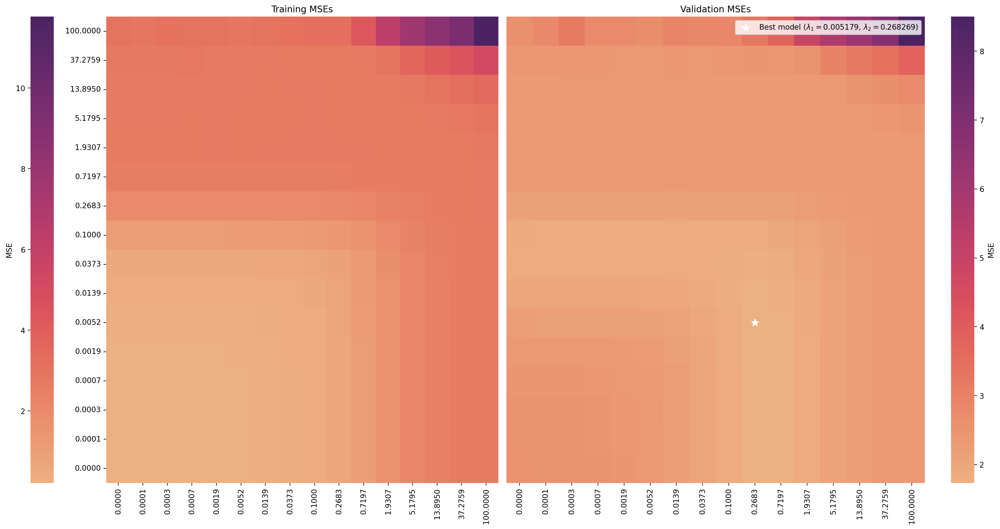

In [212]:
rng = (0, 20)
M = 10
N = 20
k = 10
D = 70
lambdas = np.concatenate(([0], np.logspace(-4, 2, 15)))
x = np.random.uniform(*rng, N)

train_mses = [[[] for _ in lambdas] for _ in lambdas]
validation_mses = [[[] for _ in lambdas] for _ in lambdas]

for ds in range(M):
  y = f(x) + np.random.standard_normal(N)
  x_train, y_train, x_test, y_test = split(x, y, 0.8)
  for i, l1 in enumerate(lambdas):
    for j, l2 in enumerate(lambdas):
      print(f"Running iteration {ds + 1} out of {M} with (λ1={i}, λ2={j})", end='\r')
      tr, v, _, _ = cross_validation(x_train, y_train, x_test, y_test, k, l1=l1, l2=l2, bases=D)

      train_mses[i][j].extend(tr)
      validation_mses[i][j].extend(v)

train_mses = np.mean(train_mses, axis=2)
validation_mses = np.mean(validation_mses, axis=2)
best = np.unravel_index(np.argmin(validation_mses, axis=None), validation_mses.shape)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.set_title("Training MSEs")
ax2.set_title("Validation MSEs")

ax1.set_xlabel("$\\lambda_2$")
ax2.set_xlabel("$\\lambda_2$")
ax1.set_ylabel("$\\lambda_1$")
ax2.set_ylabel("$\\lambda_1$")

sns.heatmap(train_mses[::-1], xticklabels=[f'{l:.4f}' for l in lambdas], yticklabels=[f'{l:.4f}' for l in reversed(lambdas)], cmap='flare', ax=ax1, cbar_kws={'label': 'MSE', 'location': 'left' })
sns.heatmap(validation_mses[::-1], xticklabels=[f'{l:.4f}' for l in lambdas], yticklabels=[], cmap='flare', ax=ax2, cbar_kws={'label': 'MSE'})

ax2.scatter(best[1] + 0.5, 15 - best[0] + 0.5, s=100, c='white', marker='*', label=f"Best model ($\\lambda_1={str(lambdas[best[0]])[:8]}$, $\\lambda_2={str(lambdas[best[1]])[:8]}$)")
ax2.legend()
plt.tight_layout()

plt.savefig("orig.png", dpi=600, bbox_inches='tight')
print("Best model MSE:", validation_mses[best])